In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
from AnalysisUtils import AnalysisUtils
AnalysisUtilsObj=AnalysisUtils()

dataset=pd.read_csv('PreProcessedTradeSettlementDetails.csv')
dataset

,Trade ID,Trade Type,Instrument Type,Trade Value,Trade Volume,Counterparty ID,Counterparty Risk Score,Counterparty Failures,Settlement Status,Settlement Failure Reason,...,Time to Settle,Counterparty Failure Rate,Currency,Settlement Type,Client ID,ISIN,Trade Matched or Not,Expected Settlement Date,Actual Settlement Date,Days Difference
0,T00001,Buy,Derivative,6.117879e+05,94974,CP15,0.197086,2,Success,NONE,...,42.461085,0.02,JPY,AoP,CL24,INE000004E,Matched,2024-02-21,2024-02-21,0
1,T00002,Sell,Derivative,7.307262e+05,16986,CP8,0.458036,2,Success,NONE,...,61.836701,0.02,INR,FoP,CL43,INE000026S,Not Matched,2024-09-11,2024-09-11,0
2,T00003,Buy,Derivative,1.317804e+05,92472,CP29,0.802380,7,Fail,Insufficient Funds,...,32.604111,0.07,EUR,AoP,CL7,INE000024D,Matched,2024-07-01,2024-07-03,2
3,T00004,Buy,Bond,3.243996e+05,21069,CP42,0.914575,2,Success,NONE,...,42.245322,0.02,INR,AoP,CL11,INE000028L,Matched,2024-04-09,2024-04-09,0
4,T00005,Buy,Derivative,5.392381e+05,13532,CP39,0.153635,9,Success,NONE,...,49.037923,0.09,INR,FoP,CL36,INE000031G,Matched,2024-03-19,2024-03-19,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,T09996,Sell,Derivative,7.986397e+05,6858,CP34,0.944301,6,Success,NONE,...,53.863479,0.06,JPY,AoP,CL33,INE000011H,Matched,2024-11-05,2024-11-05,0
9996,T09997,Buy,Derivative,2.931886e+05,65604,CP14,0.744404,2,Success,NONE,...,32.956419,0.02,EUR,AoP,CL17,INE0000385,Matched,2024-02-14,2024-02-14,0
9997,T09998,Sell,Equity,8.856600e+05,75400,CP36,0.325795,6,Fail,Documentation Issue,...,32.857306,0.06,EUR,AoP,CL33,INE000045O,Matched,2024-08-06,2024-08-09,3
9998,T09999,Sell,Bond,1.632633e+06,58087,CP48,0.639493,2,Success,NONE,...,41.631755,0.02,EUR,FoP,CL35,INE000001N,Not Matched,2024-02-04,2024-02-04,0


In [3]:
dataset.shape

(10000, 25)

In [ ]:
dataset.shape[0]

In [5]:
dataset.shape[1]

25

#Pairplot is used to see all the combinations of the relations of the input values
1) Counter Party Failures Vs Counter Party Failure Rate -> When COunter Party Failures increase, Counter Party Failure Rate also increasing.
2) Settlement DUration Vs Time To Settle -> When Settlement Duration increases, Time to settle also increasing.

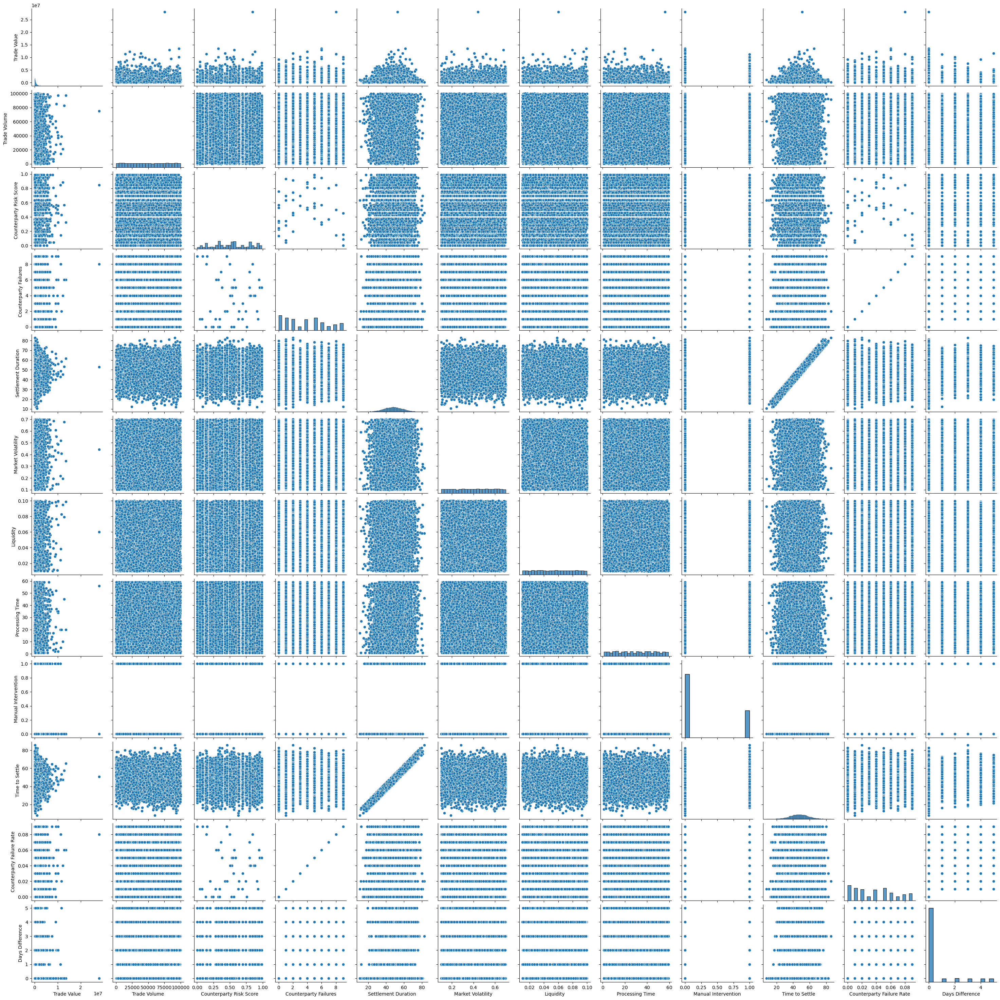

In [8]:
import seaborn as sns
sns.pairplot(dataset)

#Segregate Settled and Failed Data

In [20]:
successDataset=dataset[dataset['Settlement Status']=='Success']
failDataset=dataset[dataset['Settlement Status']=='Fail']

In [ ]:
#We have more Failures because of Technical Error and less Failure because of Counter Party Short to Deliver

<Figure size 1200x600 with 0 Axes>

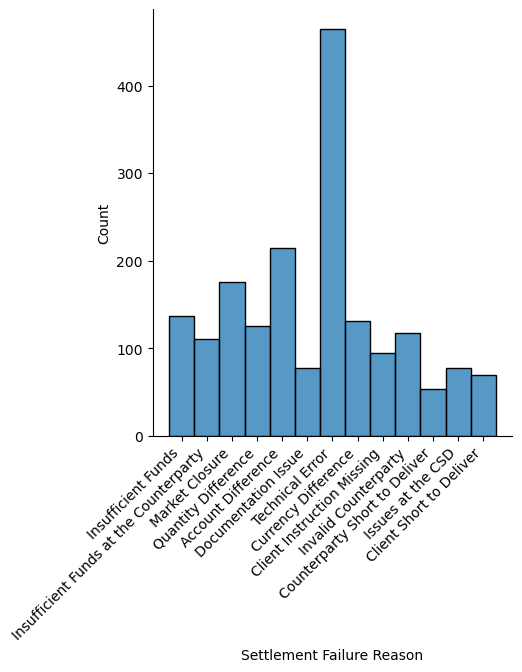

In [18]:
plt.figure(figsize=(12, 6))  # Increase figure size
sns.displot(failDataset['Settlement Failure Reason'])
plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()

In [ ]:
#Looks like Manual intervantion is could not be the failure reason because we have less number of Manual intevantion failure

<Figure size 1200x600 with 0 Axes>

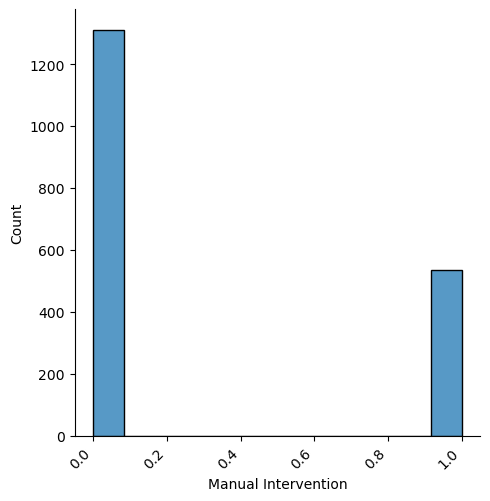

In [22]:
plt.figure(figsize=(12, 6))  # Increase figure size
sns.displot(failDataset['Manual Intervention'])
plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()

#When Counter Party Failure rate is high, we expect more number of failure

<Figure size 1200x600 with 0 Axes>

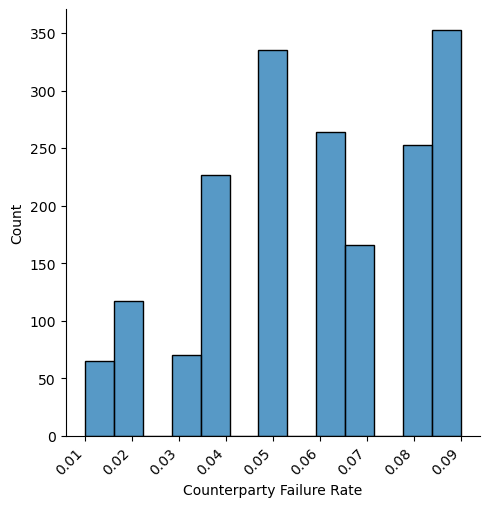

In [24]:
plt.figure(figsize=(12, 6))  # Increase figure size
sns.displot(failDataset['Counterparty Failure Rate'])
plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()

#No Observation

<Figure size 1200x600 with 0 Axes>

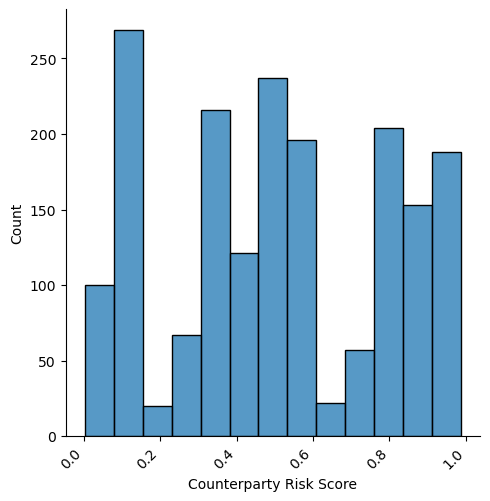

In [28]:
plt.figure(figsize=(12, 6))  # Increase figure size
sns.displot(failDataset['Counterparty Risk Score'])
plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()

##When Counter Party Failures is high, we expect more number of failure

<Figure size 1200x600 with 0 Axes>

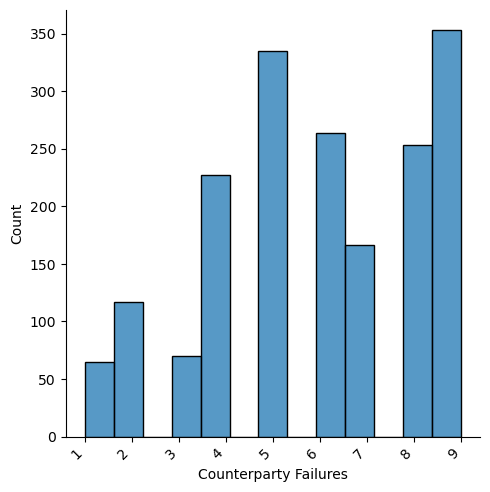

In [30]:
plt.figure(figsize=(12, 6))  # Increase figure size
sns.displot(failDataset['Counterparty Failures'])
plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()

#We have most of the failure trade took settlement duration of around 50 

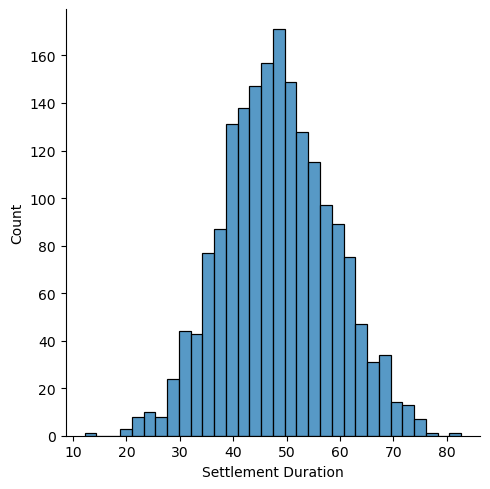

In [34]:
sns.displot(failDataset['Settlement Duration'])

#When we have more Market Volatility, we have more Failure

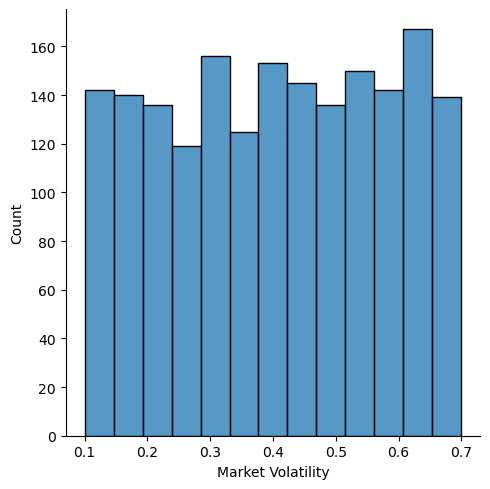

In [36]:
sns.displot(failDataset['Market Volatility'])

#When we have less Liquidity, we have less Failure

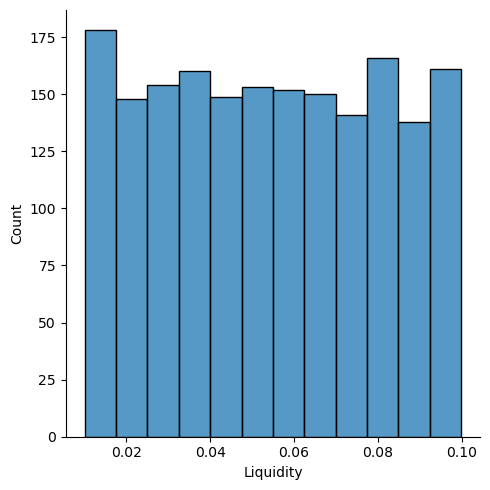

In [38]:
sns.displot(failDataset['Liquidity'])

#When it take processing time of 20 to 30, we have more failures

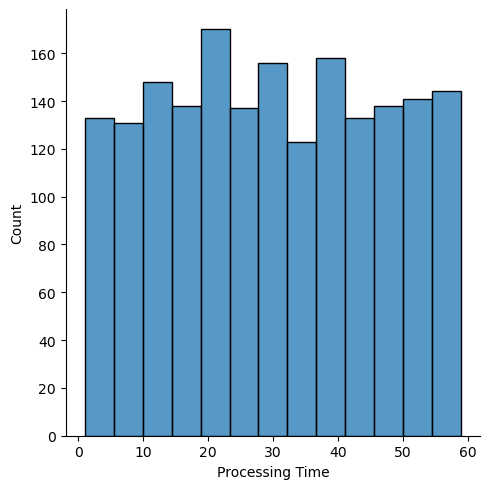

In [40]:
sns.displot(failDataset['Processing Time'])

#When trade value is less, Trade volume is high

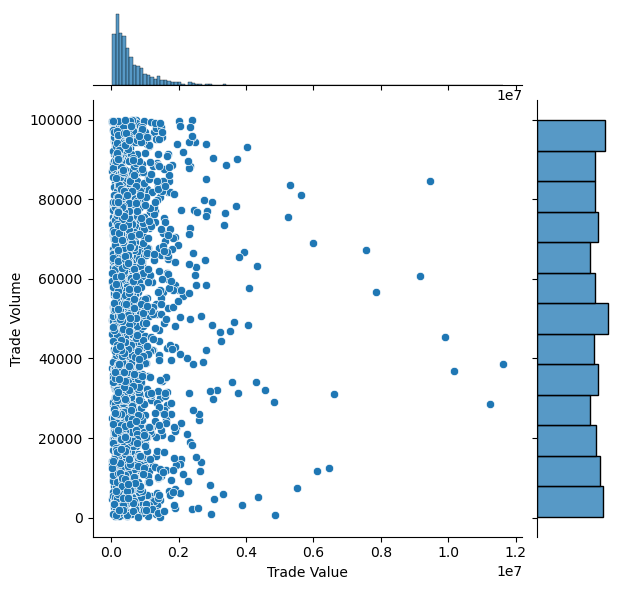

In [44]:
sns.jointplot(x='Trade Value',y='Trade Volume',data=failDataset)

#Days Difference are not showing any difference based on number of trade volume

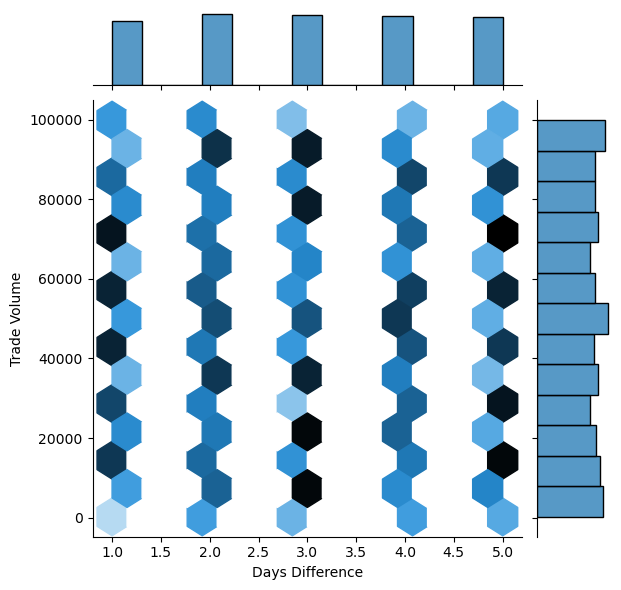

In [50]:
sns.jointplot(x='Days Difference',y='Trade Volume',data=failDataset, kind='hex')

#it will help us to see the all combinations of the variables

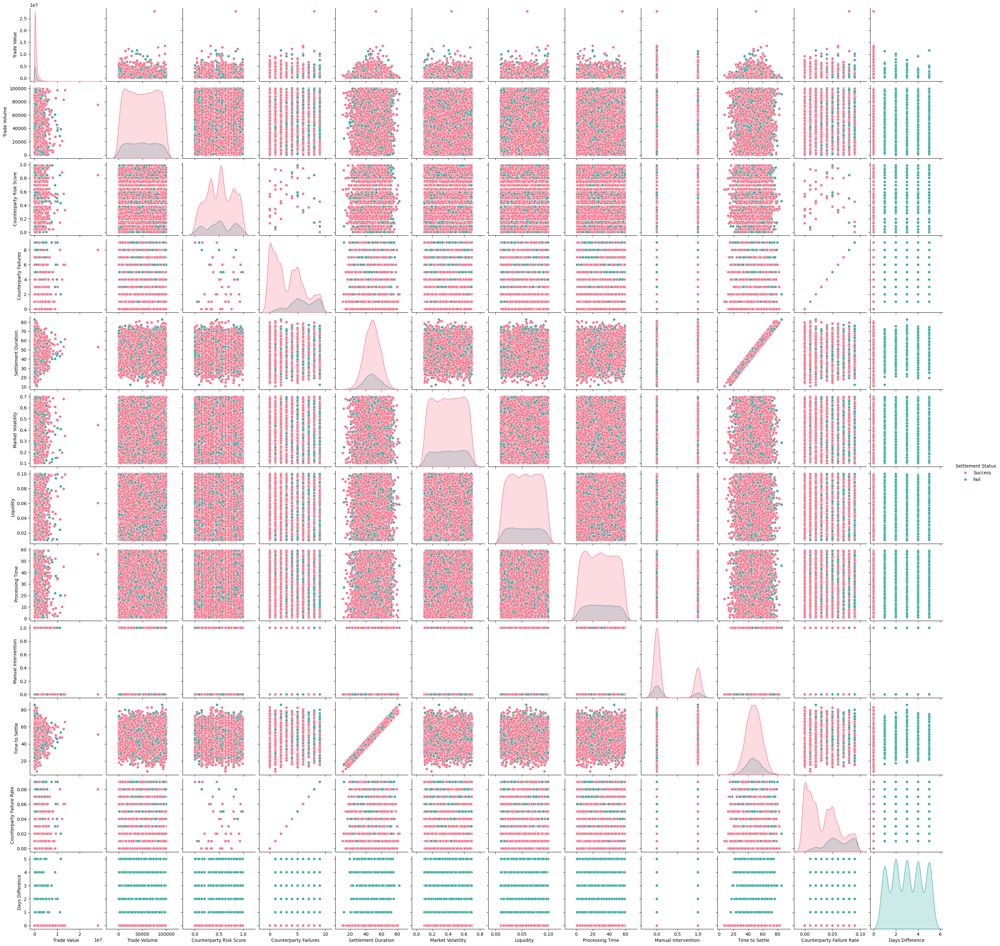

In [52]:
sns.pairplot(dataset,hue='Settlement Status',diag_kind='kde',kind='scatter',palette='husl')

#When we have trade volume greater than 80000, we have 'Insufficient Funds', 'Counterparty Short to Deliver', 'Insufficient Funds at the Counterparty', 'Client Short to Deliver'

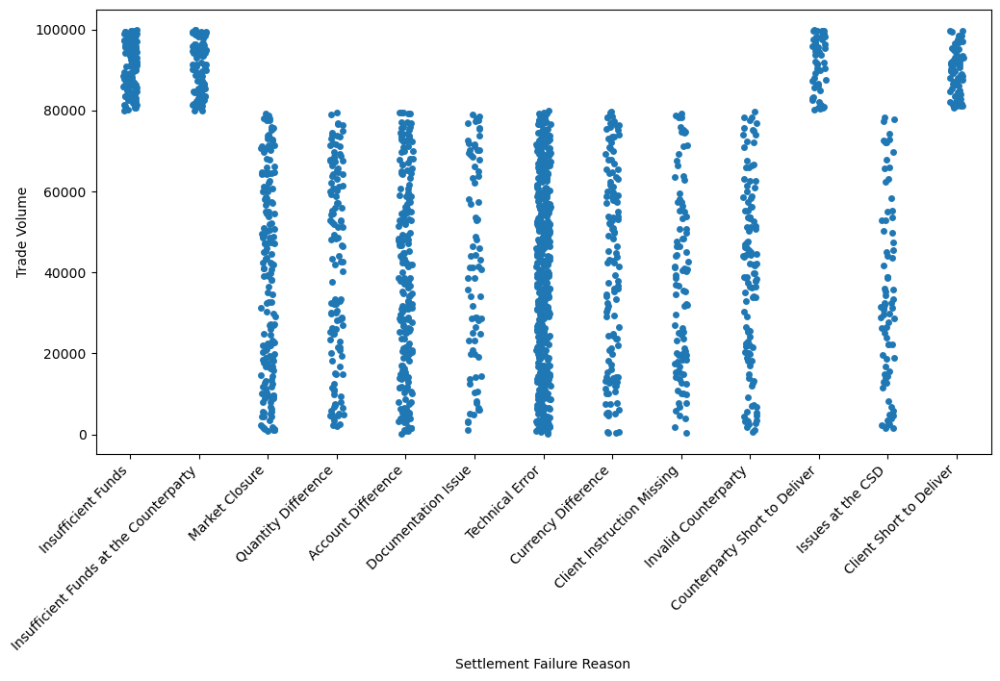

In [56]:
plt.figure(figsize=(12, 6))  # Increase figure size
sns.stripplot(x='Settlement Failure Reason', y='Trade Volume', data=failDataset, jitter=True)

plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()
#sns.stripplot(x='Settlement Failure Reason',y='Trade Volume',data=dataset)

#When we have Volatility more than 0.5, we have more Technical error

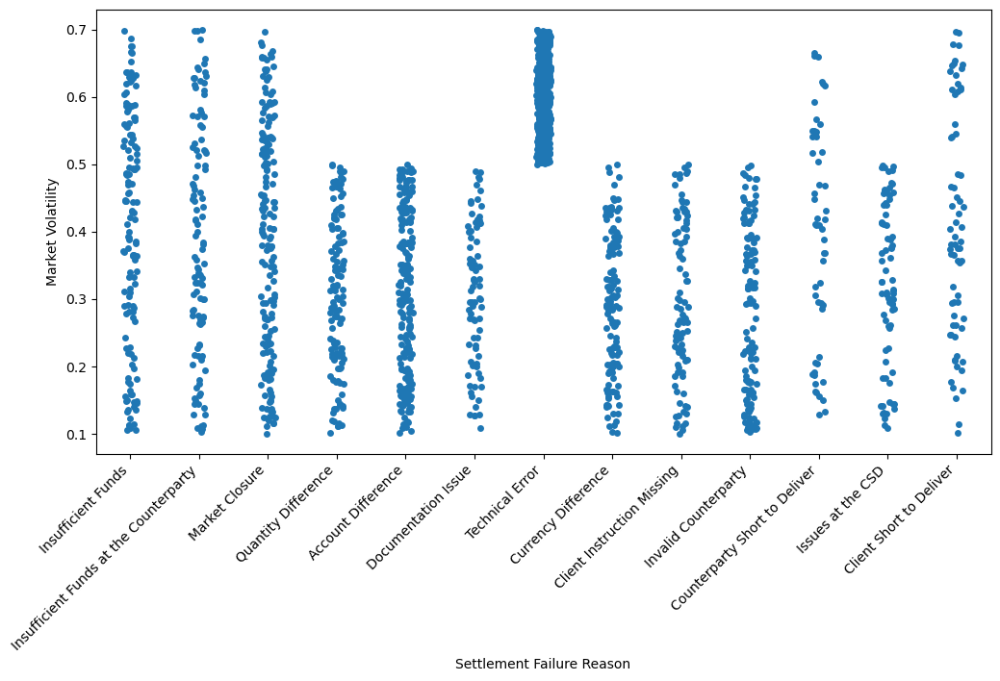

In [60]:
plt.figure(figsize=(12, 6))  # Increase figure size
sns.stripplot(x='Settlement Failure Reason', y='Market Volatility', data=failDataset, jitter=True)

plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()
#sns.stripplot(x='Settlement Failure Reason',y='Trade Volume',data=dataset)

In [ ]:
##When we have liquity less than 0.05, we have more Market Closure error

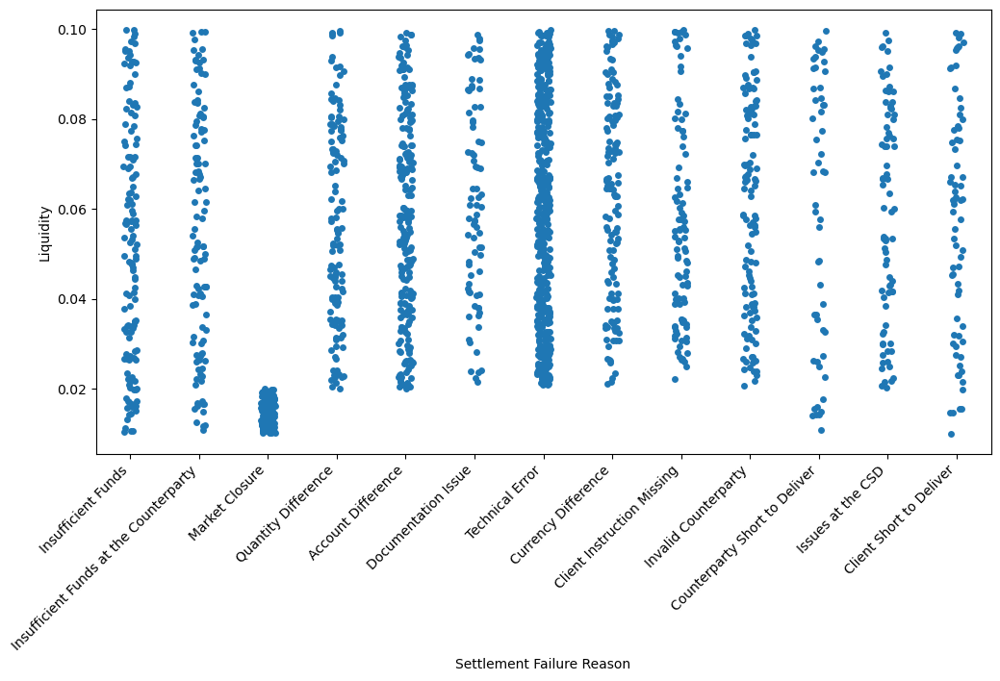

In [62]:
plt.figure(figsize=(12, 6))  # Increase figure size
sns.stripplot(x='Settlement Failure Reason', y='Liquidity', data=failDataset, jitter=True)

plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()
#sns.stripplot(x='Settlement Failure Reason',y='Trade Volume',data=dataset)

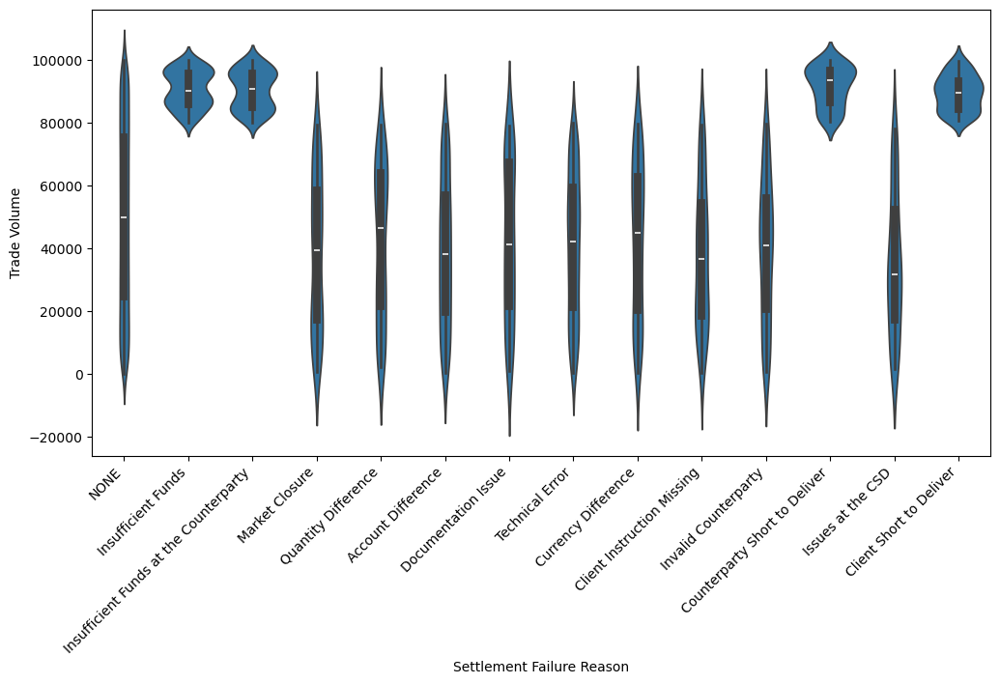

In [70]:

plt.figure(figsize=(12, 6))  # Increase figure size
sns.violinplot(x='Settlement Failure Reason',y='Trade Volume',data=dataset)

plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()

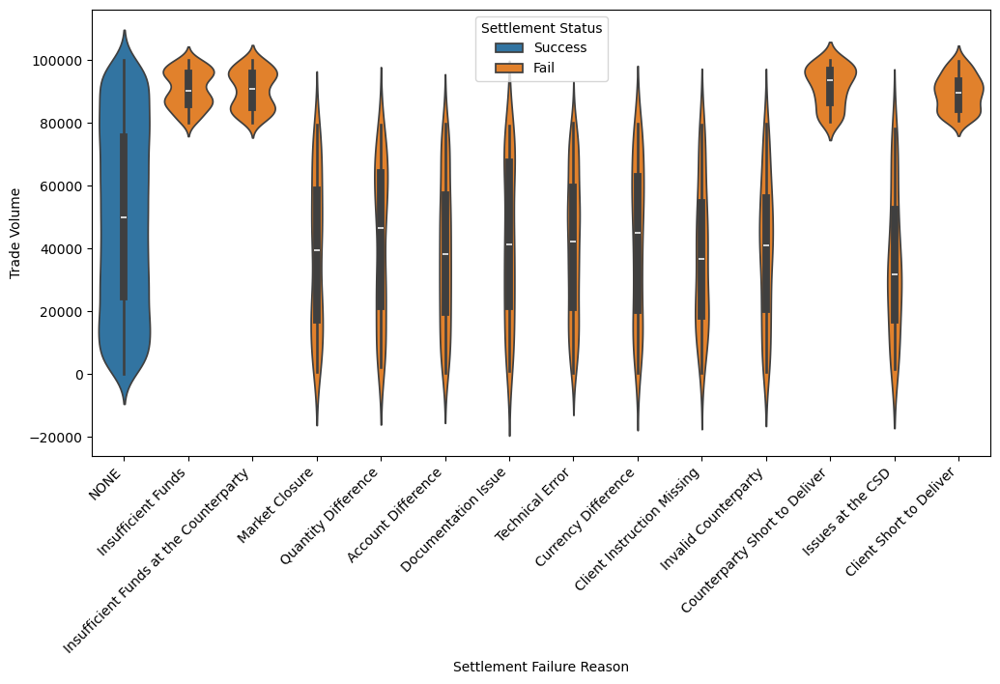

In [72]:


plt.figure(figsize=(12, 6))  # Increase figure size
sns.violinplot(x='Settlement Failure Reason',y='Trade Volume',data=dataset,hue='Settlement Status')

plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()

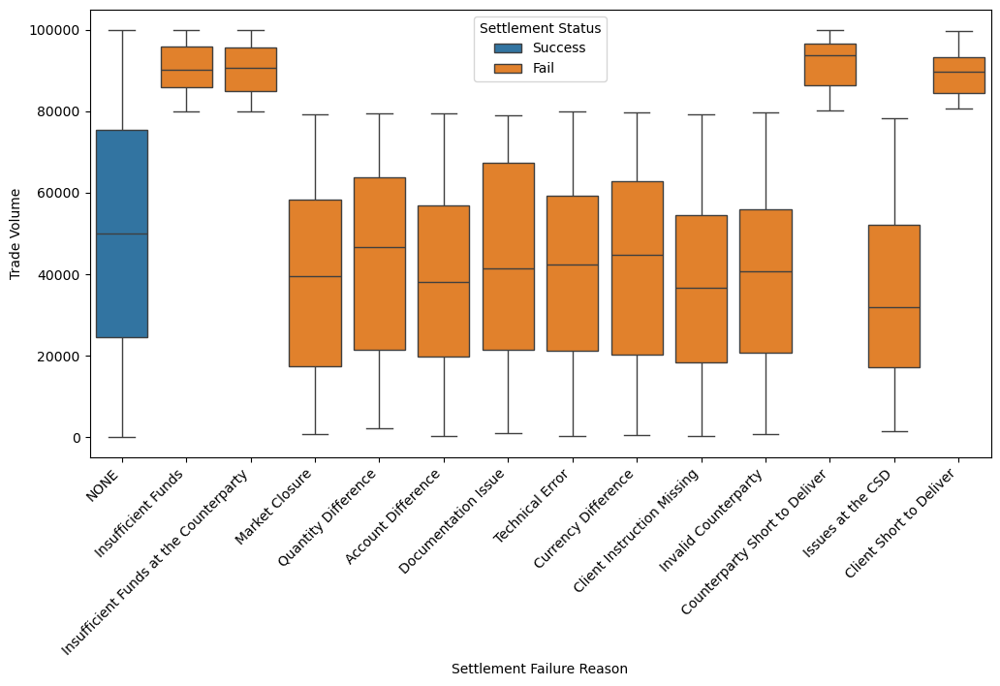

In [76]:



plt.figure(figsize=(12, 6))  # Increase figure size
sns.boxplot(x='Settlement Failure Reason',y='Trade Volume',data=dataset,hue='Settlement Status')

plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()

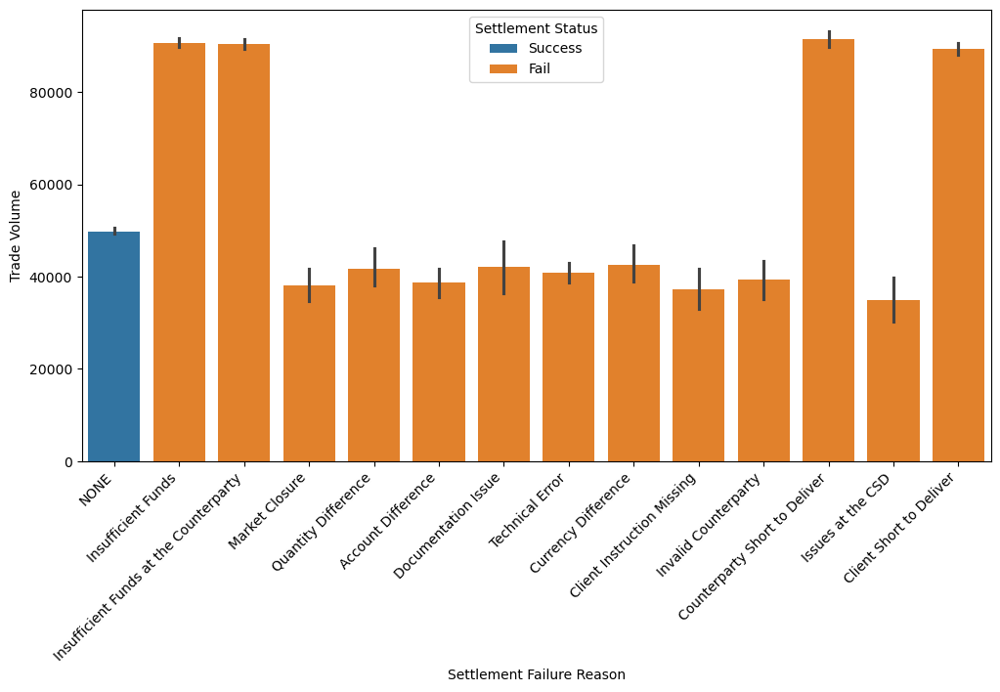

In [78]:
plt.figure(figsize=(12, 6))  # Increase figure size
sns.barplot(x='Settlement Failure Reason',y='Trade Volume',data=dataset,hue='Settlement Status')

plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()

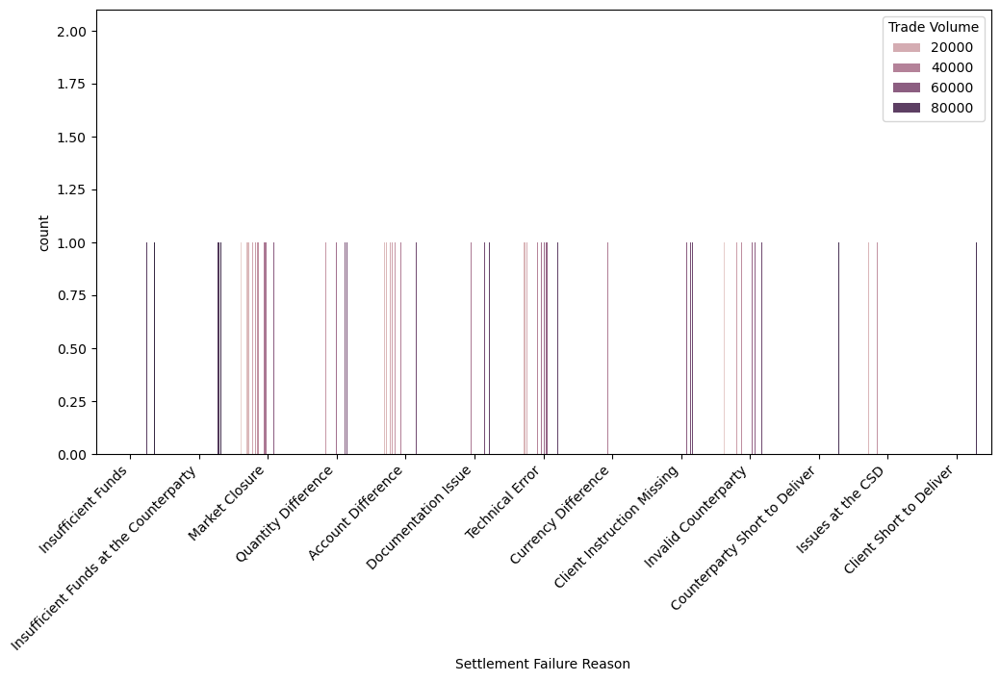

In [84]:
plt.figure(figsize=(12, 6))  # Increase figure size
sns.countplot(x='Settlement Failure Reason',data=failDataset,hue='Trade Volume')

plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()


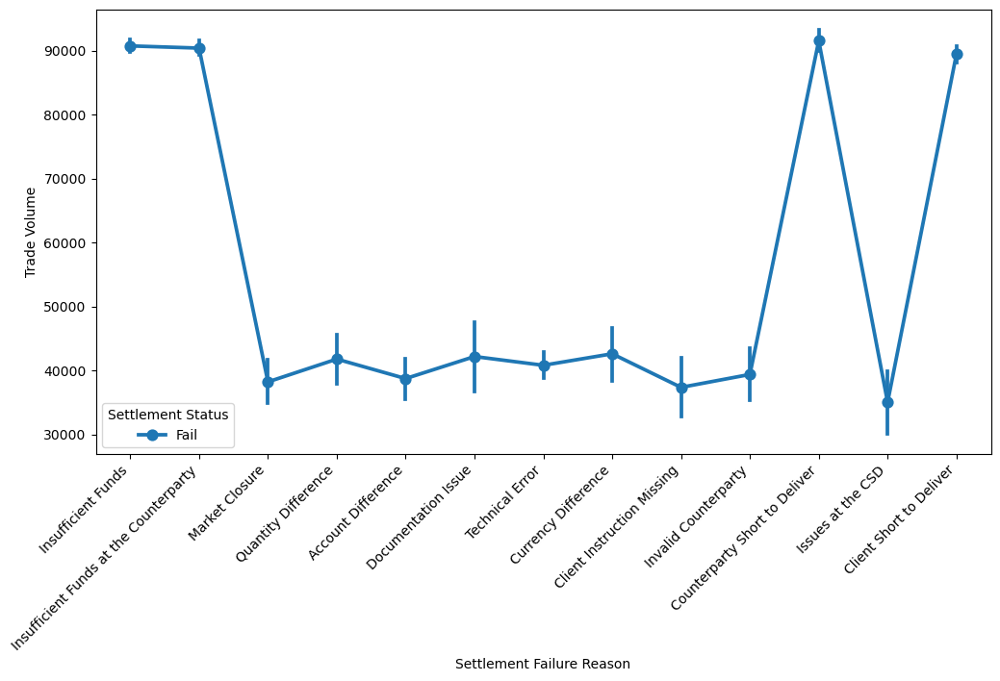

In [86]:
plt.figure(figsize=(12, 6))  # Increase figure size
sns.pointplot(x='Settlement Failure Reason',y='Trade Volume',data=failDataset,hue='Settlement Status')

plt.xticks(rotation=45, ha='right')  # Rotate labels for better readability
plt.show()